# **Rice Leaf Disease Image Classification Using CNN**

**Project ID : "PTID-CDS-APR21-1130"**

**Project Name: PRCP-1001-Rice Leaf**

**Project done by:**
**Shubam**(shubamaihole@gmail.com),





# **Business case:**
>To classify the images using convolutional Neural Network(CNN).

# Type of problem  :
>For the  given data we Performed convolutional neural network task with MobileNetV2 function.

# **Domain Analysis:**

This dataset contains 120 jpg images of disease infected rice leaves. The images are grouped into 3 classes based on the type of disease. There are 40 images in each class.

### **Classes**

>Leaf smut.

>Brown spot.

>Bacterial leaf blight.

This dataset is associated with the following paper:

[Detection and Classification of Rice Plant Diseases](https://www.researchgate.net/publication/318437440_Detection_and_classification_of_rice_plant_)

The authors gathered these leaves from a rice field in a village called Shertha in Gujarat, India.

## **Importing libraries**

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import os

import matplotlib.pyplot as plt
import tensorflow as tf

from tensorflow.keras.utils import to_categorical
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.python.keras.preprocessing.image import ImageDataGenerator

from sklearn.metrics import classification_report, log_loss, accuracy_score
from sklearn.model_selection import train_test_split

#**mounting to Drive**

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## **Data Summary**
>119 jpg images of various sizes

>3 classes --> leaf smut, brown spot and bacterial leaf blight

>40 images per class

>There are no images of normal rice leaves i.e. not disease infected.

>According to the paper the leaves were placed against a white background before being photographed.

#**Extracting path:**

In [10]:
fpath = "/content/drive/MyDrive/DS Project/PRCP_1001_Rice_Leaf_ (1)/Data"
random_seed = 111

categories = os.listdir(fpath)
print("List of categories = ",categories,"\n\nNo. of categories = ", len(categories))

List of categories =  ['Bacterial leaf blight', 'Brown spot', 'Leaf smut'] 

No. of categories =  3


### **VISUALIZATION**

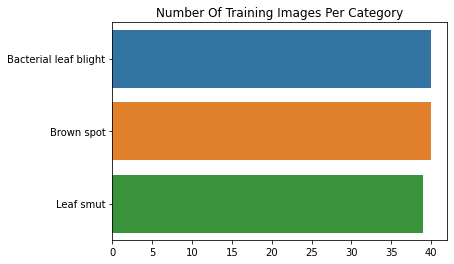

In [11]:

category_names = os.listdir(fpath) # output: ['leaf smut', 'bacterial leaf blight','Brown spot']
nb_categories = len(category_names) # output: 3
train_images = []

for category in category_names:
    folder = fpath + "/" + category
    train_images.append(len(os.listdir(folder)))

sns.barplot(y=category_names, x=train_images).set_title("Number Of Training Images Per Category");

In [12]:
import pathlib
data_dir = pathlib.Path(fpath)
data_dir

PosixPath('/content/drive/MyDrive/DS Project/PRCP_1001_Rice_Leaf_ (1)/Data')

### Display few random images from dataset with their label:

In [13]:
Bacterial_leaf_blight = list(data_dir.glob('Bacterial leaf blight/*'))
len(Bacterial_leaf_blight)

40

#### **1) Bacterial Leaf Blight**
> Parts of a plant where it affects: commonly affects leaves of the plant

> Shape of symptoms : Symptoms contain elongated lesions on the leaf tip,
lesions are several inches long

> Lesion color : Yellow to White due to the effect of bacteria

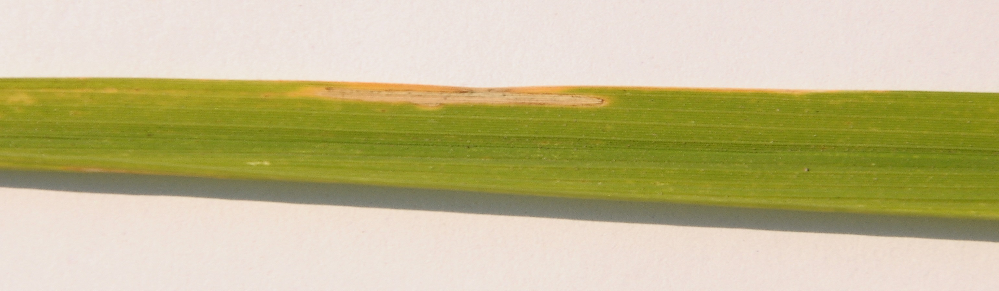

In [14]:
import PIL
PIL.Image.open(str(Bacterial_leaf_blight[0]))

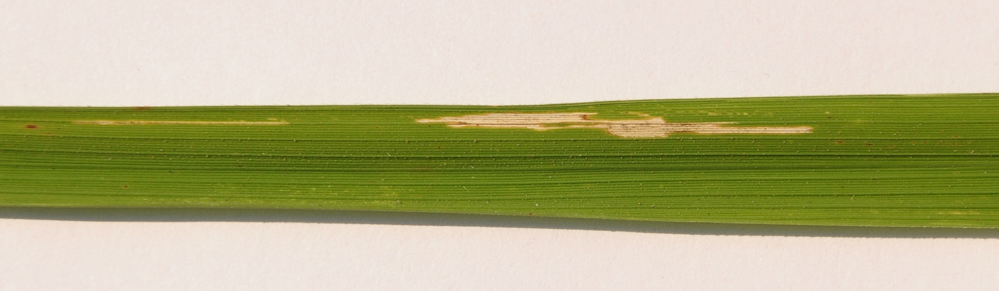

In [15]:
PIL.Image.open(str(Bacterial_leaf_blight[39]))

In [16]:
Brown_spot=list(data_dir.glob('Brown spot/*'))
len(Bacterial_leaf_blight)

40

####**2) Brown Spot**
> Parts of a plant where it affects: commonly affects leaves of the plant

> Shape of symptoms: The symptoms of the disease are round to oval shape.

> Lesion color: Reddish Brown to Dark Brown.


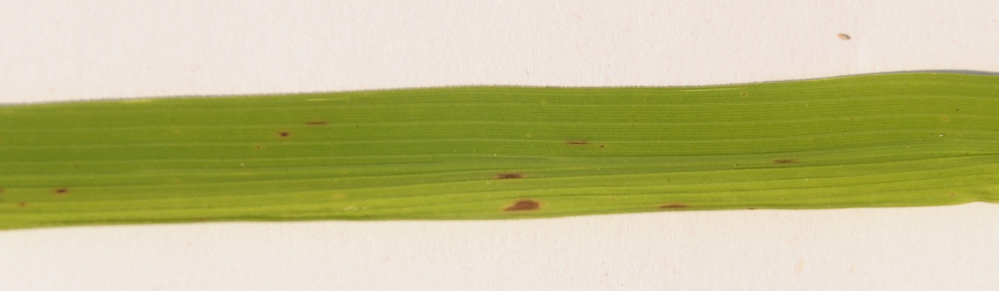

In [17]:
PIL.Image.open(str(Brown_spot[1]))

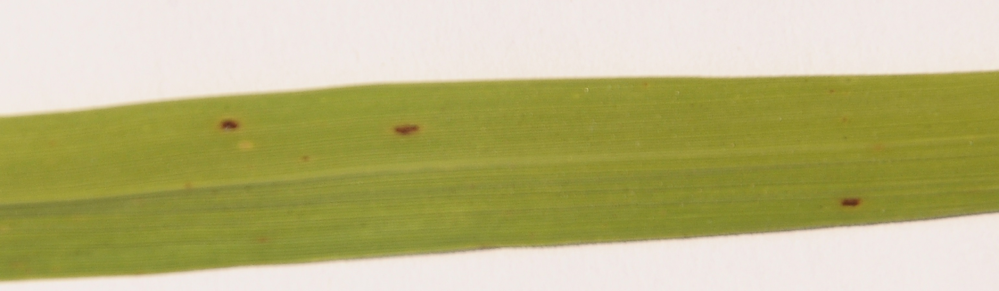

In [18]:
PIL.Image.open(str(Brown_spot[39]))

####**3) Leaf Smut**
> Parts of a plant where it affects: commonly affects leaves of the plant`

> Shape of symptoms: The symptoms of the disease are small spots scattered
throughout the leaf in non-uniform shape.

> Lesion color: Reddish Brown

In [19]:
Leaf_smut=list(data_dir.glob('Leaf smut/*'))
len(Leaf_smut)

39

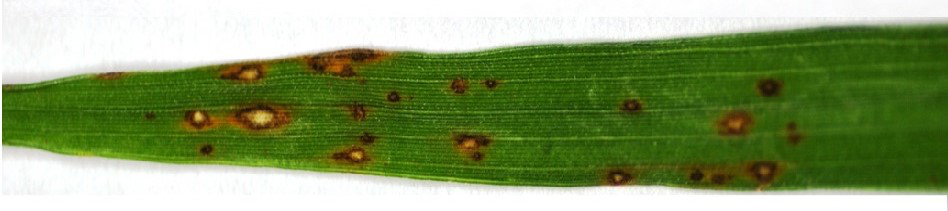

In [20]:
PIL.Image.open(str(Leaf_smut[0]))

In [23]:
base_dir = "/content/drive/MyDrive/DS Project/PRCP_1001_Rice_Leaf_ (1)/Data"

In [24]:
LABELS = os.listdir(base_dir)
LABELS.sort()
LABELS

['Bacterial leaf blight', 'Brown spot', 'Leaf smut']

#####**Normalization**
>The pixel values of these images are integers in the range 0–255. Normalizing the pixel values reduces them to float values in the range [0, 1]. 

In [25]:
dataset=[]
testset=[]
count=0

for label in LABELS:
    i=0
#     path = base_dir + '/' + label
    path = os.path.join(base_dir, label)
#     print(path)
    for img in os.listdir(path):
#         print(img)
        image=load_img(os.path.join(path, img), grayscale=False, color_mode='rgb', target_size=(100,100))
        image=img_to_array(image)
        image=image/255.0
        if i<30:
            dataset.append([image,count])
            i+=1
        else:
            testset.append([image,count])
    count=count+1

In [26]:

len(dataset)

90

In [27]:
X,y =zip(*dataset)
test, test_labels=zip(*testset)

In [28]:
len(X), len(y), len(test), len(test_labels)

(90, 90, 29, 29)

>We'll load the images and their labels into two stratified train and test set numpy arrays. In order to accurately estimate the final generalizability of our model, we need to set aside the test set, and not look at it for the entire model analysis. That allows it to remain a truly independent sample.

In [29]:
y = to_categorical(y)
y=np.array(y)
X=np.array(X)
print("Train Shape:{}\nTrain Labels shape: {}".format(X.shape,y.shape))

Train Shape:(90, 100, 100, 3)
Train Labels shape: (90, 3)


In [30]:
X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.2, random_state=99)

In [31]:
X_train.shape, X_valid.shape, y_train.shape, y_valid.shape

((72, 100, 100, 3), (18, 100, 100, 3), (72, 3), (18, 3))

#####**Augmentation**
>The dataset has only 40 images per class. This is not enough data to get good results.

>Image data augmentation is a technique to artificially increase the size of the training dataset using techniques like scaling (or resizing), cropping, flipping (horizontal or vertical or both), padding, rotation, translation (movement along x or y-axis). Colour augmentation techniques include adjusting the brightness, contrast, saturation, and hue of the images.

In [32]:
datagen = ImageDataGenerator(
    
    vertical_flip=True,
    rotation_range=30,
    zoom_range=0.3,
    width_shift_range=0.3,
    height_shift_range=0.3,
    shear_range=0.2,
    fill_mode="nearest",
    validation_split=0.2,
)

>This function returns a Keras image classification model, optionally loaded with weights pre-trained on ImageNet.

>MobileNetV2 is very similar to the original MobileNet, except that it uses inverted residual blocks with bottlenecking features. 

>It has a drastically lower parameter count than the original MobileNet. 

>MobileNets support any input size greater than 32 x 32, with larger image sizes offering better performance.

In [33]:
pretrained_model = tf.keras.applications.MobileNetV2(
    input_shape=(100,100,3),
    include_top=False,
    weights='imagenet',
    pooling='avg'
)

pretrained_model.trainable = False

9420800/9406464 [==============================] - 0s 0us/step


>The model’s input is defined to have a size of (100, 100, 3).

In [34]:
inputs = pretrained_model.input

m = tf.keras.layers.Dense(128, activation='relu')(pretrained_model.output)

outputs = tf.keras.layers.Dense(3, activation='softmax')(m)

mn_model = tf.keras.Model(inputs=inputs, outputs=outputs)

In [35]:
mn_model.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

In [36]:
hist = mn_model.fit(
    datagen.flow(X_train, y_train, batch_size=32), 
    validation_data = (X_valid, y_valid),validation_split=0.0,epochs=40)

Epoch 1/40
3/3 [==============================] - 33s 613ms/step - loss: 1.3359 - accuracy: 0.4028 - val_loss: 0.9088 - val_accuracy: 0.5556
Epoch 2/40
3/3 [==============================] - 0s 59ms/step - loss: 0.7449 - accuracy: 0.7083 - val_loss: 0.7913 - val_accuracy: 0.6111
Epoch 3/40
3/3 [==============================] - 0s 63ms/step - loss: 0.7444 - accuracy: 0.6806 - val_loss: 0.9618 - val_accuracy: 0.6667
Epoch 4/40
3/3 [==============================] - 0s 60ms/step - loss: 0.5325 - accuracy: 0.8194 - val_loss: 1.2135 - val_accuracy: 0.7222
Epoch 5/40
3/3 [==============================] - 0s 87ms/step - loss: 0.5606 - accuracy: 0.7778 - val_loss: 0.8043 - val_accuracy: 0.7222
Epoch 6/40
3/3 [==============================] - 0s 62ms/step - loss: 0.3871 - accuracy: 0.8333 - val_loss: 0.5043 - val_accuracy: 0.8333
Epoch 7/40
3/3 [==============================] - 0s 59ms/step - loss: 0.3586 - accuracy: 0.8611 - val_loss: 0.4570 - val_accuracy: 0.7778
Epoch 8/40
3/3 [=========

>The model’s accuracy on the input data is tracked at the end of every epoch.

>At the end of 30 epochs, we are able to achieve 83.33% accuracy on validation data.

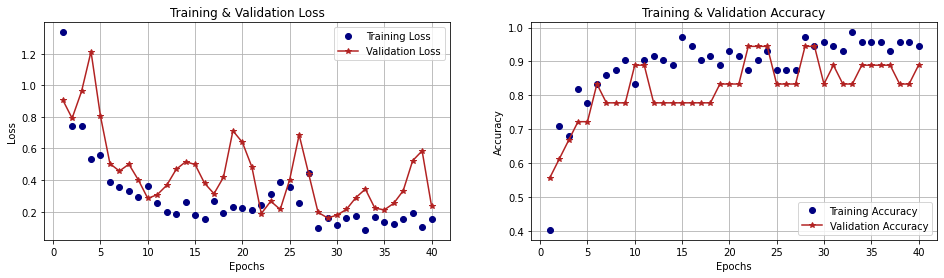

In [37]:
 def show_plots(hist):
    """ Useful function to view plot of loss values & accuracies across the various epochs """
    loss_vals = hist['loss']
    val_loss_vals = hist['val_loss']
    epochs = range(1, len(hist['accuracy'])+1)
    
    f, ax = plt.subplots(nrows=1,ncols=2,figsize=(16,4))
 
 
 
  # plot losses on ax[0]
    ax[0].plot(epochs, loss_vals, color='navy',marker='o', linestyle=' ', label='Training Loss')
    ax[0].plot(epochs, val_loss_vals, color='firebrick', marker='*', label='Validation Loss')
    ax[0].set_title('Training & Validation Loss')
    ax[0].set_xlabel('Epochs')
    ax[0].set_ylabel('Loss')
    ax[0].legend(loc='best')
    ax[0].grid(True)

 # plot accuracies
    acc_vals = hist['accuracy']
    val_acc_vals = hist['val_accuracy']

    ax[1].plot(epochs, acc_vals, color='navy', marker='o', ls=' ', label='Training Accuracy')
    ax[1].plot(epochs, val_acc_vals, color='firebrick', marker='*', label='Validation Accuracy')
    ax[1].set_title('Training & Validation Accuracy')
    ax[1].set_xlabel('Epochs')
    ax[1].set_ylabel('Accuracy')
    ax[1].legend(loc='best')
    ax[1].grid(True)



    plt.show()
    plt.close()
    
    # delete locals from heap before exiting
    del loss_vals, val_loss_vals, epochs, acc_vals, val_acc_vals
show_plots(hist.history)

> Wherever epochs increases their losses are decreases in both Train and Validation Loss.

>Wherever ecpochs increase their accuracy is also increases automatically in both Trainning and validation accuracy.
 

In [38]:
y_pred = mn_model.predict(X_valid)
pred = np.argmax(y_pred,axis=1)
actual = np.argmax(y_valid,axis=1)
print(classification_report(actual,pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00         5
           1       0.80      0.80      0.80         5
           2       0.88      0.88      0.88         8

    accuracy                           0.89        18
   macro avg       0.89      0.89      0.89        18
weighted avg       0.89      0.89      0.89        18



Here we get 83 perecent of accuracy and also f1 score for 3 class are very good.

# **Evaluate on Test data**

In [39]:
test = np.array(test)
test_pred = mn_model.predict(test)

predictions = []
for p in test_pred:
    result = np.argmax(p)      
    predictions += [result]
    
print(len(predictions))

29


In [40]:
test_actuals = list(test_labels)
len(test_actuals)

29

In [41]:
accuracy = accuracy_score(test_actuals, predictions)
print(accuracy)

0.5517241379310345


accuracy for the test data is 86 percent.

## **Test using single image**

In [42]:
def predict_image(image):
    image=img_to_array(image) 
    image=image/255.0
    prediction_image=np.array(image)
    prediction_image= np.expand_dims(image, axis=0)
    
    pred = mn_model.predict(prediction_image)
    value = np.argmax(pred)
    print("Prediction : ", LABELS[value])

Prediction :  Bacterial leaf blight


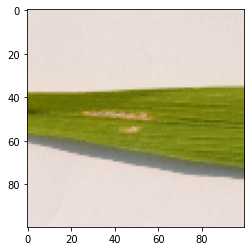

In [44]:
image=load_img("/content/drive/MyDrive/DS Project/PRCP_1001_Rice_Leaf_ (1)/Data/Bacterial leaf blight/DSC_0367.JPG",target_size=(100,100))
predict_image(image)
plt.imshow(image)
plt.show()

we passsed above a image  using a link from  the drive. Actually it is 'bacterial leaf blight' and it is also predicted as 'Bacterial leaf blight'.

Prediction :  Leaf smut


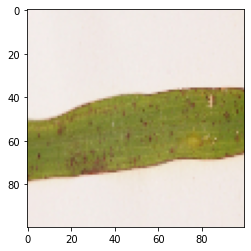

In [45]:
image=load_img("/content/drive/MyDrive/DS Project/PRCP_1001_Rice_Leaf_ (1)/Data/Leaf smut/DSC_0312.JPG",target_size=(100,100))
predict_image(image)
plt.imshow(image)
plt.show()

we passsed above a image  using a link from  the drive. Actually it is  'leaf smut' and it is also predicted as  'leaf smut'

Prediction :  Brown spot


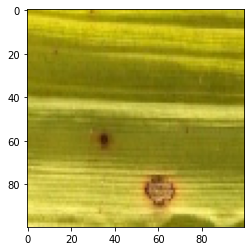

In [46]:
image=load_img("/content/drive/MyDrive/DS Project/PRCP_1001_Rice_Leaf_ (1)/Data/Brown spot/DSC_0111.jpg",target_size=(100,100))
predict_image(image)
plt.imshow(image)
plt.show()

we passsed above a image  using a link from  the drive. Actually it is  'Brown spot' and it is also predicted as  'Brown spot'

# **Conclusion:**

    

In the above we bulid a image classification model using convolutional neural network with MobileNetV2 function for the given image dataset. In this dataset we have 119 images with different classes as 'Bacterial leaf blight','Leaf smut' and 'Brown spot'.

 we sperated the data into trainset and testset. For the trainset we fit the model using MobileNetV2 function and we get the accuracy as 83 percent. Same model is also fit for the testset also, we get the accuracy as 86 percent. 

Using single images we also classified very well and we get Actual and Prediction images are same.